In [ ]:
# Hardware configuration
import tensorflow as tf
from tensorflow.python.client import device_lib
device_lib.list_local_devices()


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 9034444115222630193
 xla_global_id: -1]

## **Import Necessary Libraries**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import random
import cv2
import os
import PIL
import pathlib
import glob as gb
# import splitfolders
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard
import tensorflow_hub as hub
from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model

# Display Sample Images of Dataset

In [ ]:
data_path = "D:/BRACU materials/CV/FAHMID/MSc BRACU/Courses/CSE713 Advanced Syntactic Pattern Recognition/Dataset/Tomato"

In [ ]:
# Upload Image zip in Google Colab
from google.colab import files
uploaded = files.upload()

Saving Dataset.zip to Dataset.zip


In [ ]:
# Unzip and extract images
import zipfile

with zipfile.ZipFile("Dataset.zip", 'r') as zip_ref:
    zip_ref.extractall("Dataset")

# Check folder structure
os.listdir("Dataset")

['Strawberry',
 'Corn (Maize)',
 'Potato',
 'Cherry',
 'Peach',
 'Apple',
 'Bell Pepper',
 'Tomato',
 'Grape']

In [ ]:
os.listdir("Dataset/Tomato")

['Val', 'Train', 'Test']

In [ ]:
os.listdir("Dataset/Tomato/Train")

['Bacterial Spot',
 'Septoria Leaf Spot',
 'Late Blight',
 'Early Blight',
 'Yellow Leaf Curl Virus',
 'Healthy']

In [ ]:
def display_random_class_images(base_path, plant_name, subset_name, num_images=6):
    subset_path = os.path.join(base_path, plant_name, subset_name)

    # Get all class folders
    class_folders = [f for f in os.listdir(subset_path) if os.path.isdir(os.path.join(subset_path, f))]
    if not class_folders:
        print(f"No class folders found in {subset_path}")
        return

    # Randomly pick a class folder
    chosen_class = random.choice(class_folders)
    class_path = os.path.join(subset_path, chosen_class)

    # Get image paths
    image_files = [os.path.join(class_path, f) for f in os.listdir(class_path)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if not image_files:
        print(f"No images found in {class_path}")
        return

    sample_images = random.sample(image_files, min(num_images, len(image_files)))

    # Plot the images
    plt.figure(figsize=(15, 3))
    for i, img_path in enumerate(sample_images):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.title(f"{chosen_class}", fontsize=9)
        plt.axis('off')
    plt.suptitle(f"{plant_name} - {subset_name.capitalize()} - {chosen_class}", fontsize=14)
    plt.tight_layout()
    plt.show()


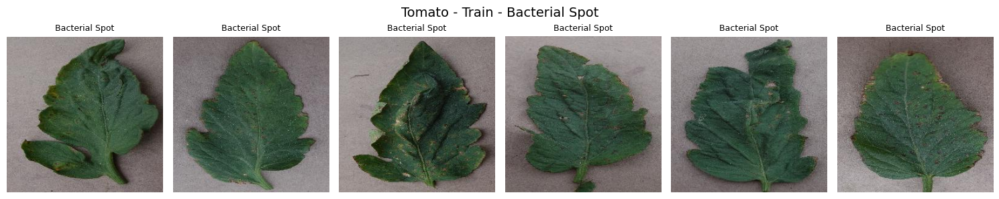

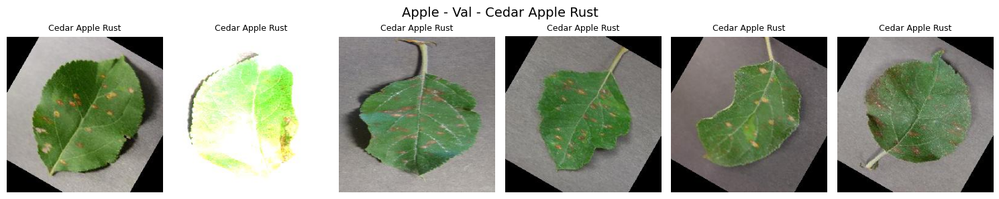

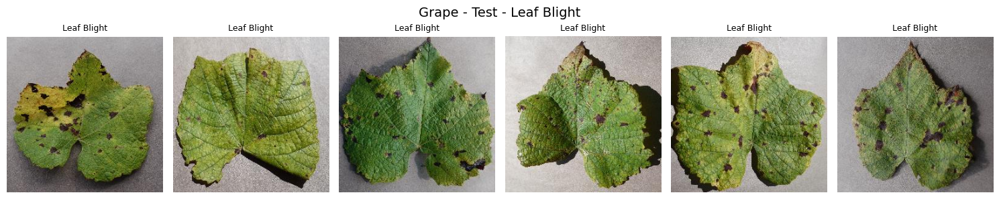

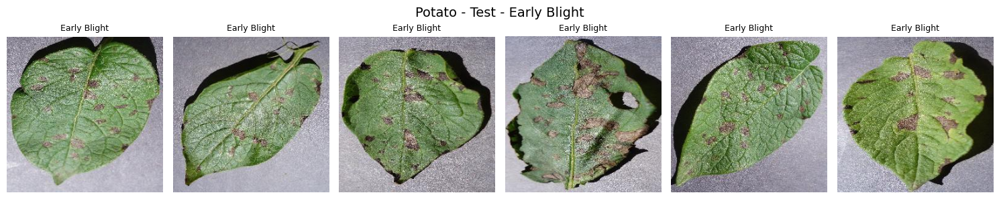

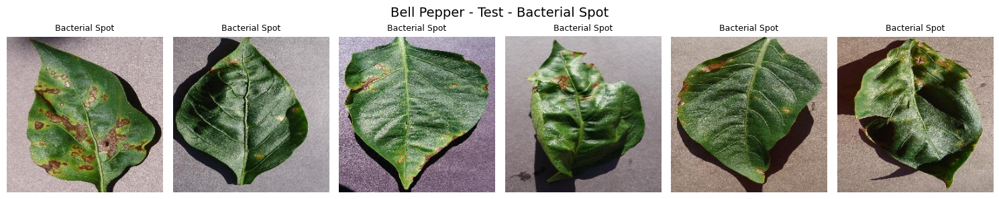

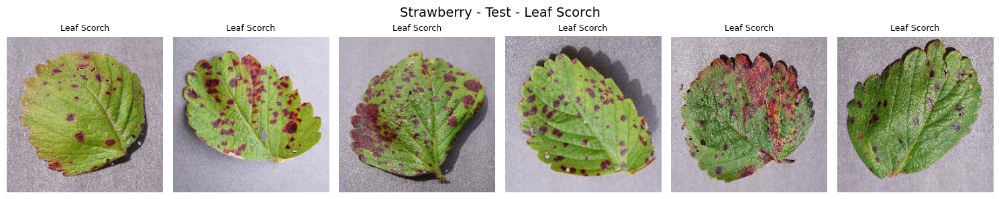

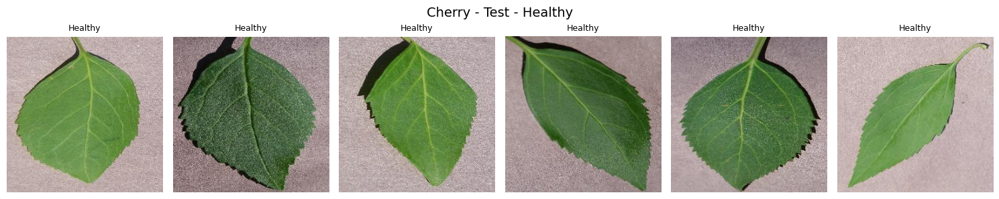

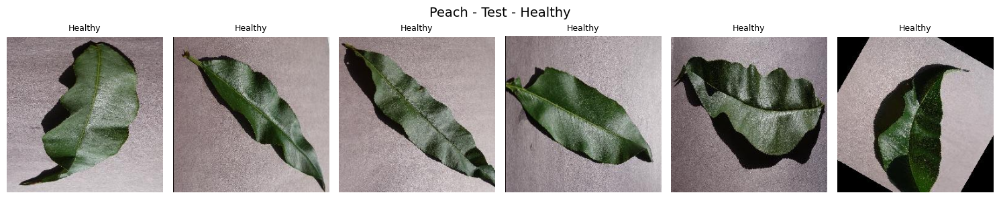

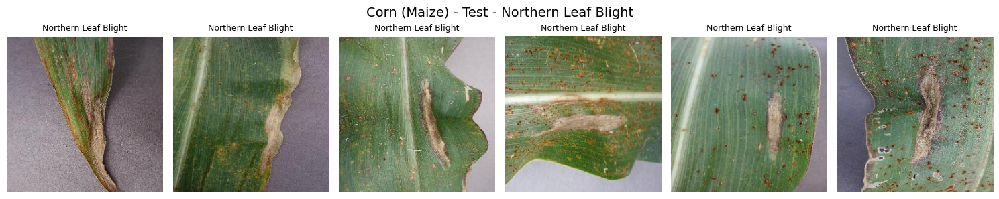

In [ ]:
# Base folder where your Dataset was extracted
dataset_path = "Dataset"

# Sample Tomato Images
display_random_class_images(dataset_path, "Tomato", "Train")
display_random_class_images(dataset_path, "Apple", "Val")
display_random_class_images(dataset_path, "Grape", "Test")
display_random_class_images(dataset_path, "Potato", "Test")
display_random_class_images(dataset_path, "Bell Pepper", "Test")
display_random_class_images(dataset_path, "Strawberry", "Test")
display_random_class_images(dataset_path, "Cherry", "Test")
display_random_class_images(dataset_path, "Peach", "Test")
display_random_class_images(dataset_path, "Corn (Maize)", "Test")

## Displaying Only Tomato Sample Images

In [ ]:
def display_tomato_class_samples(base_path, subset, num_classes=3, num_images_per_class=3):
    """
    base_path: path to the Dataset folder
    subset: 'train', 'val', or 'test'
    """
    tomato_path = os.path.join(base_path, 'Tomato', subset)
    class_folders = [d for d in os.listdir(tomato_path) if os.path.isdir(os.path.join(tomato_path, d))]

    selected_classes = random.sample(class_folders, min(num_classes, len(class_folders)))

    plt.figure(figsize=(num_images_per_class * 3, num_classes * 3))

    img_count = 1
    for cls in selected_classes:
        class_path = os.path.join(tomato_path, cls)
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('.jpg', '.jpeg', '.png'))]
        sampled_imgs = random.sample(images, min(num_images_per_class, len(images)))

        for img_name in sampled_imgs:
            img_path = os.path.join(class_path, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(num_classes, num_images_per_class, img_count)
            plt.imshow(img)
            plt.title(cls, fontsize=8)
            plt.axis('off')
            img_count += 1

    plt.suptitle(f"Tomato - {subset.capitalize()} Set", fontsize=16)
    plt.tight_layout()
    plt.show()


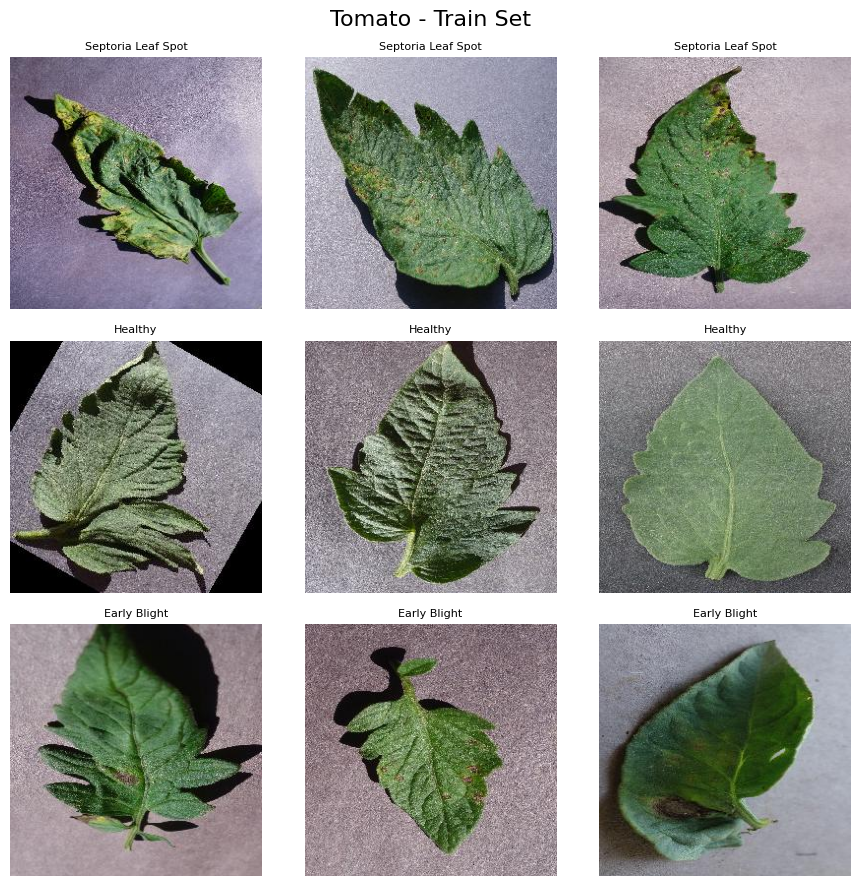

In [ ]:
dataset_path = "Dataset"  # this is where the zip was extracted

display_tomato_class_samples(dataset_path, 'Train')

In [ ]:
def display_random_tomato_images(base_path, plant_name='Tomato', total_images=10):
    image_pool = []

    # Loop through splits
    for split in ['Train', 'Val', 'Test']:
        split_path = os.path.join(base_path, plant_name, split)

        # Loop through class folders
        for class_name in os.listdir(split_path):
            class_path = os.path.join(split_path, class_name)
            if not os.path.isdir(class_path):
                continue

            for img_file in os.listdir(class_path):
                if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    image_pool.append({
                        'img_path': os.path.join(class_path, img_file),
                        'class_name': class_name,
                        'split': split
                    })

    # Randomly sample 6 images
    sampled = random.sample(image_pool, min(total_images, len(image_pool)))

    # Plotting
    plt.figure(figsize=(15, 5))
    for i, sample in enumerate(sampled):
        img = cv2.imread(sample['img_path'])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(2, total_images, i+1)
        plt.imshow(img)
        plt.title(f"{sample['split']}\n{sample['class_name']}", fontsize=9)
        plt.axis('off')
    plt.suptitle(f"Random 10 Images from {plant_name}", fontsize=16)
    plt.tight_layout()
    plt.show()

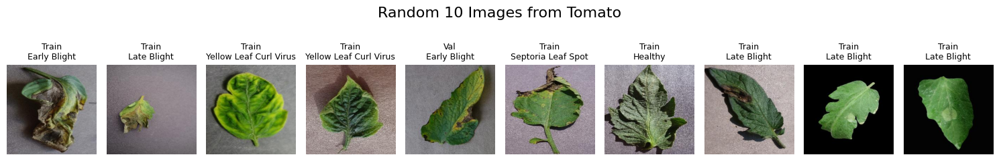

In [ ]:
# Set your dataset base path
dataset_path = "Dataset"

# Display 6 random Tomato images
display_random_tomato_images(dataset_path, plant_name='Tomato')

# Extrapolatory Data Analysis

In [ ]:
def count_images_per_class(train_path):
    class_counts = {}
    for class_name in os.listdir(train_path):
        class_folder = os.path.join(train_path, class_name)
        if os.path.isdir(class_folder):
            image_files = [f for f in os.listdir(class_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            class_counts[class_name] = len(image_files)
    return class_counts

In [ ]:
def plot_class_distribution(class_counts, title="Number of Training Images per Tomato class"):
    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    plt.figure(figsize=(6, 6))
    bars = plt.bar(classes, counts, color='tomato')
    plt.xlabel('Tomato Classes')
    plt.ylabel('Number of Images')
    plt.title(title)
    plt.xticks(rotation=35,ha='right')

    # Add value labels on top of bars
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 5, int(yval), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

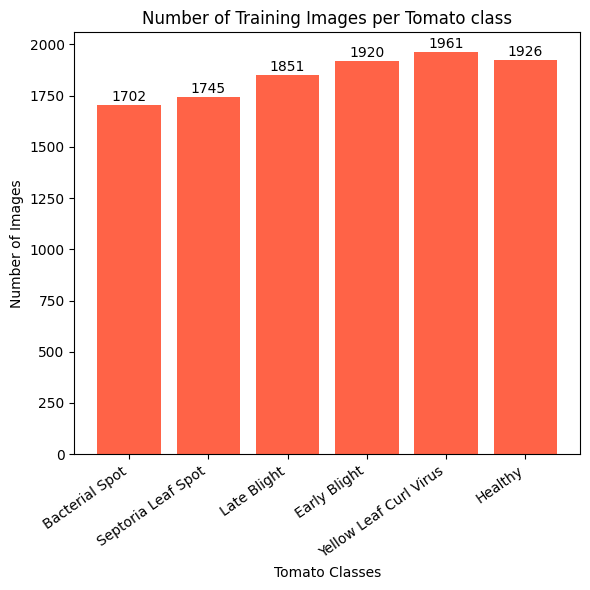

In [ ]:
tomato_train_path = os.path.join("Dataset", "Tomato", "Train")

class_counts = count_images_per_class(tomato_train_path)
plot_class_distribution(class_counts)

In [ ]:
def plot_pie_chart(class_counts, title="Tomato Train Set - Class Percentage Distribution"):
    labels = list(class_counts.keys())
    sizes = list(class_counts.values())

    plt.figure(figsize=(4, 4))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.Set3.colors)
    plt.title(title)
    plt.axis('equal')  # Equal aspect ratio makes it a perfect circle
    plt.show()

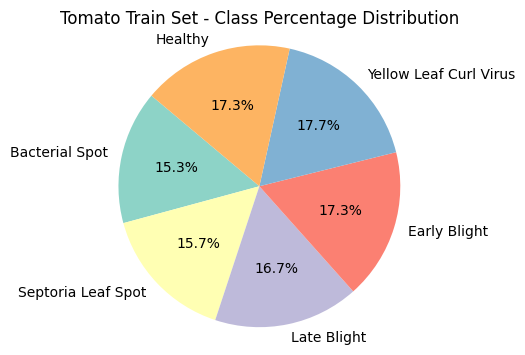

<Figure size 640x480 with 0 Axes>

In [ ]:
tomato_train_path = os.path.join("Dataset", "Tomato", "Train")

class_counts = count_images_per_class(tomato_train_path)
plot_pie_chart(class_counts)
plt.savefig("PieChart.png")

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define data augmentation transformations
augmentor = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
train_dir = os.path.join("Dataset", "Tomato", "Train")

# Load images in batches of 1 just for visualization
train_generator = augmentor.flow_from_directory(
    directory=train_dir,
    target_size=(224, 224),  # You can change the size based on your model
    batch_size=1,
    class_mode='categorical',
    shuffle=True
)


Found 11108 images belonging to 6 classes.


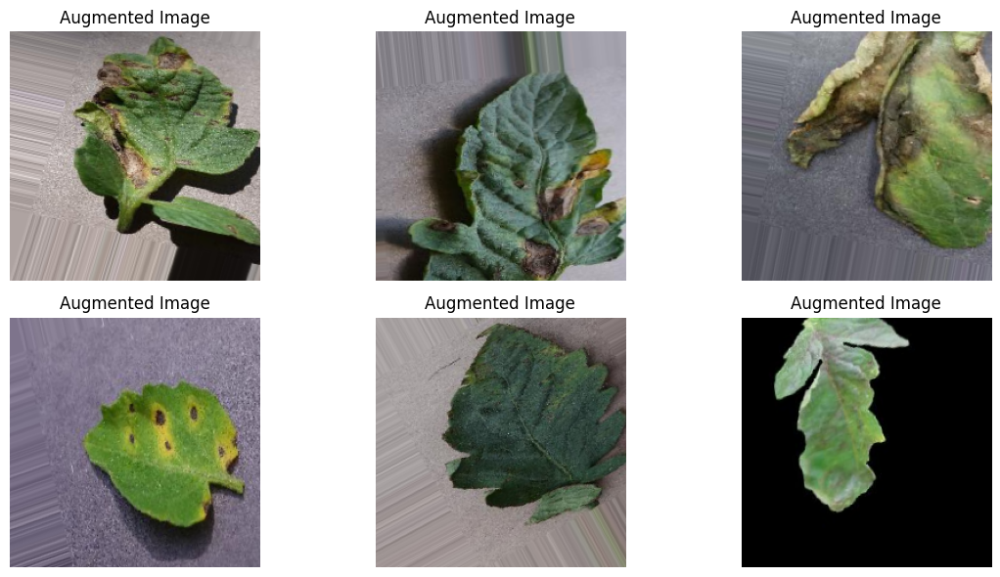

In [ ]:
# Display 6 augmented images
plt.figure(figsize=(12, 6))
for i in range(6):
    img, label = next(train_generator)  # Get a batch of 1 image
    plt.subplot(2, 3, i + 1)
    plt.imshow(img[0].astype(np.uint8))
    plt.title("Augmented Image")
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
!pip install tensorflow-addons

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
#import tensorflow_addons as tfa
import os
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
img_size = 224
batch_size = 32
dataset_path = "Dataset/Tomato"

train_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(dataset_path, 'Train'),
    image_size=(img_size, img_size),
    batch_size=batch_size,
    label_mode='categorical'
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(dataset_path, 'Val'),
    image_size=(img_size, img_size),
    batch_size=batch_size,
    label_mode='categorical'
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(dataset_path, 'Test'),
    image_size=(img_size, img_size),
    batch_size=batch_size,
    label_mode='categorical'
)

class_names = train_ds.class_names
num_classes = len(class_names)


Found 11108 files belonging to 6 classes.
Found 2495 files belonging to 6 classes.
Found 280 files belonging to 6 classes.


# ViT Model

In [ ]:
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

def create_vit_classifier(input_shape=(224, 224, 3), num_classes=6):
    inputs = layers.Input(shape=input_shape)
    # Patch creation
    patch_size = 16
    num_patches = (input_shape[0] // patch_size) ** 2
    projection_dim = 64

    # Patch embedding
    # Wrap tf.image.extract_patches in a Lambda layer
    # Specify the output_shape for the Lambda layer
    # Remove tf.expand_dims as it's already applied in the layers.Lambda
    patches = layers.Lambda(
        lambda x: tf.image.extract_patches(
            images=x,  # Directly use 'x' here
            sizes=[1, patch_size, patch_size, 1],
            strides=[1, patch_size, patch_size, 1],
            rates=[1, 1, 1, 1],
            padding='VALID'
        )[0],
        output_shape=(num_patches, patch_size * patch_size * input_shape[-1])  # Specify output shape
    )(inputs)  # Apply the Lambda layer to 'inputs'

    patch_dims = patches.shape[-1]
    x = layers.Reshape((num_patches, patch_dims))(patches)
    x = layers.Dense(projection_dim)(x)

    # ... (rest of your code remains the same)

    # Positional embedding
    position_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)
    positions = tf.range(start=0, limit=num_patches, delta=1)
    x = x + position_embedding(positions)

    # Transformer blocks
    for _ in range(4):  # 4 transformer blocks
        x1 = layers.LayerNormalization(epsilon=1e-6)(x)
        attention_output = layers.MultiHeadAttention(num_heads=4, key_dim=projection_dim)(x1, x1)
        x2 = layers.Add()([x, attention_output])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = mlp(x3, hidden_units=[projection_dim * 2, projection_dim], dropout_rate=0.1)
        x = layers.Add()([x2, x3])

    x = layers.LayerNormalization(epsilon=1e-6)(x)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.1)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return keras.Model(inputs=inputs, outputs=outputs)



In [ ]:
model = create_vit_classifier()
model.compile(
    loss='categorical_crossentropy',
    optimizer=keras.optimizers.Adam(1e-4),
    metrics=['accuracy']
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=40
)

Epoch 1/40


ValueError: Exception encountered when calling Reshape.call().

[1mCannot reshape a tensor with 150528 elements to shape [14,196,768] (2107392 elements) for '{{node functional_2_1/reshape_2_1/Reshape}} = Reshape[T=DT_FLOAT, Tshape=DT_INT32](functional_2_1/lambda_3_1/strided_slice, functional_2_1/reshape_2_1/Reshape/shape)' with input shapes: [14,14,768], [3] and with input tensors computed as partial shapes: input[1] = [14,196,768].[0m

Arguments received by Reshape.call():
  • inputs=tf.Tensor(shape=(14, 14, 768), dtype=float32)

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 4))
image = x_train[np.random.choice(range(x_train.shape[0]))]
plt.imshow(image.astype("uint8"))
plt.axis("off")

resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")

n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")


NameError: name 'x_train' is not defined

<Figure size 400x400 with 0 Axes>

# Swin Transformer

In [ ]:
class PatchEmbedding(layers.Layer):
    def __init__(self, patch_size=4, embed_dim=96):
        super().__init__()
        self.proj = layers.Conv2D(embed_dim, kernel_size=patch_size, strides=patch_size)

    def call(self, x):
        x = self.proj(x)  # [B, H/patch, W/patch, embed_dim]
        _, H, W, C = x.shape
        x = tf.reshape(x, [-1, H * W, C])  # Flatten to [B, N, C]
        return x, H, W


In [ ]:
class WindowAttention(layers.Layer):
    def __init__(self, dim, window_size, num_heads):
        super().__init__()
        self.dim = dim
        self.window_size = window_size
        self.num_heads = num_heads

        self.qkv = layers.Dense(dim * 3)
        self.proj = layers.Dense(dim)

    def call(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x)
        qkv = tf.reshape(qkv, [B, N, 3, self.num_heads, C // self.num_heads])
        q, k, v = tf.unstack(qkv, axis=2)

        attn = tf.matmul(q, k, transpose_b=True)
        attn = attn / tf.math.sqrt(tf.cast(k.shape[-1], tf.float32))
        attn = tf.nn.softmax(attn, axis=-1)

        out = tf.matmul(attn, v)
        out = tf.reshape(out, [B, N, C])
        out = self.proj(out)
        return out


In [ ]:
class SwinBlock(layers.Layer):
    def __init__(self, dim, num_heads, window_size, mlp_ratio=4.):
        super().__init__()
        self.norm1 = layers.LayerNormalization()
        self.attn = WindowAttention(dim, window_size, num_heads)
        self.norm2 = layers.LayerNormalization()
        self.mlp = keras.Sequential([
            layers.Dense(int(dim * mlp_ratio), activation='gelu'),
            layers.Dense(dim)
        ])

    def call(self, x):
        shortcut = x
        x = self.norm1(x)
        x = self.attn(x)
        x = shortcut + x

        shortcut = x
        x = self.norm2(x)
        x = self.mlp(x)
        return shortcut + x


In [ ]:
class PatchMerging(layers.Layer):
    def __init__(self, input_dim):
        super().__init__()
        self.reduction = layers.Dense(input_dim * 2)

    def call(self, x, H, W):
        B, L, C = x.shape
        x = tf.reshape(x, [B, H, W, C])
        x0 = x[:, 0::2, 0::2, :]
        x1 = x[:, 1::2, 0::2, :]
        x2 = x[:, 0::2, 1::2, :]
        x3 = x[:, 1::2, 1::2, :]
        x = tf.concat([x0, x1, x2, x3], axis=-1)
        x = tf.reshape(x, [B, -1, 4 * C])
        return self.reduction(x)


In [ ]:
def build_swin_transformer(input_shape=(224, 224, 3), num_classes=6):
    inputs = keras.Input(shape=input_shape)
    x, H, W = PatchEmbedding()(inputs)

    # Stage 1
    for _ in range(2):
        x = SwinBlock(dim=96, num_heads=3, window_size=7)(x)
    x = PatchMerging(input_dim=96)(x, H, W)
    H, W = H // 2, W // 2

    # Stage 2
    for _ in range(2):
        x = SwinBlock(dim=192, num_heads=6, window_size=7)(x)
    x = PatchMerging(input_dim=192)(x, H, W)
    H, W = H // 2, W // 2

    # Stage 3
    for _ in range(6):
        x = SwinBlock(dim=384, num_heads=12, window_size=7)(x)
    x = PatchMerging(input_dim=384)(x, H, W)
    H, W = H // 2, W // 2

    # Stage 4
    for _ in range(2):
        x = SwinBlock(dim=768, num_heads=12, window_size=7)(x)

    x = layers.LayerNormalization()(x)
    x = tf.reduce_mean(x, axis=1)  # Global average pooling
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    return keras.Model(inputs, outputs)


In [ ]:
model = build_swin_transformer()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.fit(train_ds, validation_data=val_ds, epochs=35)


ValueError: Exception encountered when calling PatchEmbedding.call().

[1mAll operation outputs must be tensors. Operation <PatchEmbedding name=patch_embedding_3, built=True> returned a non-tensor. Non-tensor received: 56[0m

Arguments received by PatchEmbedding.call():
  • args=('<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=False, name=keras_tensor_153>',)
  • kwargs=<class 'inspect._empty'>

# CNN Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import os


In [ ]:
def build_cnn_model(input_shape=(224, 224, 3), num_classes=6):
    model = models.Sequential([
        layers.Input(shape=input_shape),

        layers.Conv2D(32, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model


In [ ]:
cnn_model = build_cnn_model(num_classes=num_classes)

cnn_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = cnn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)


Epoch 1/10
348/348 ━━━━━━━━━━━━━━━━━━━━ 1333s 4s/step - accuracy: 0.3591 - loss: 53.2849 - val_accuracy: 0.4886 - val_loss: 1.3408
Epoch 2/10
348/348 ━━━━━━━━━━━━━━━━━━━━ 1344s 4s/step - accuracy: 0.5455 - loss: 1.2362 - val_accuracy: 0.5419 - val_loss: 1.2581
Epoch 3/10
348/348 ━━━━━━━━━━━━━━━━━━━━ 1339s 4s/step - accuracy: 0.6148 - loss: 1.0665 - val_accuracy: 0.5142 - val_loss: 1.8395
Epoch 4/10
348/348 ━━━━━━━━━━━━━━━━━━━━ 1338s 4s/step - accuracy: 0.3000 - loss: 1.7801 - val_accuracy: 0.2012 - val_loss: 1.7421
Epoch 5/10
348/348 ━━━━━━━━━━━━━━━━━━━━ 1343s 4s/step - accuracy: 0.1992 - loss: 1.7445 - val_accuracy: 0.2012 - val_loss: 1.7405
Epoch 6/10
348/348 ━━━━━━━━━━━━━━━━━━━━ 1341s 4s/step - accuracy: 0.2023 - loss: 1.7467 - val_accuracy: 0.2012 - val_loss: 1.7407
Epoch 7/10
348/348 ━━━━━━━━━━━━━━━━━━━━ 1341s 4s/step - accuracy: 0.3076 - loss: 1.5820 - val_accuracy: 0.6088 - val_loss: 1.0413
Epoch 8/10
348/348 ━━━━━━━━━━━━━━━━━━━━ 1326s 4s/step - accuracy: 0.6442 - loss: 0.9850 -

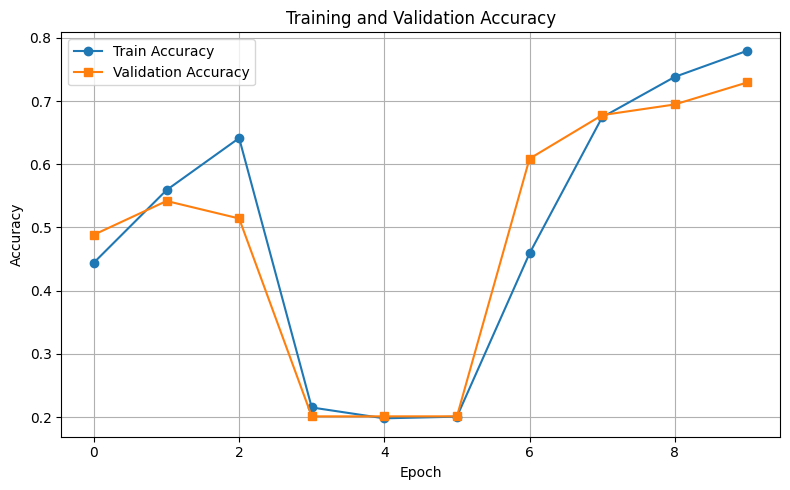

In [ ]:
import matplotlib.pyplot as plt

# Accuracy Plot
plt.figure(figsize=(8, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='s')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


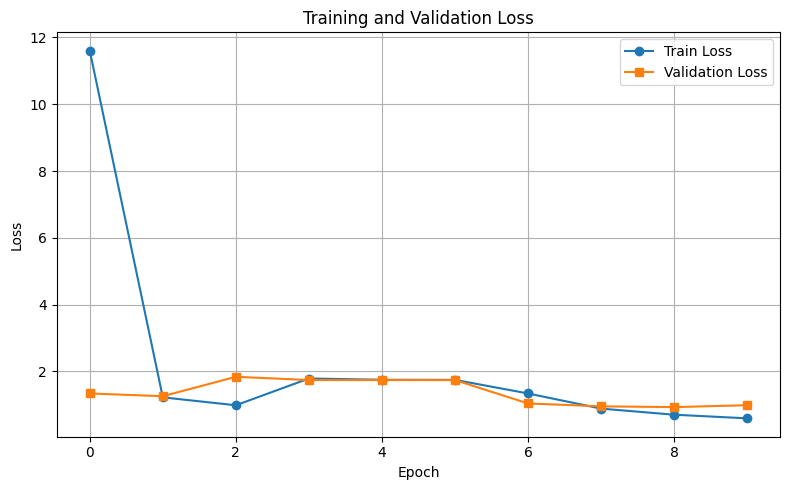

In [ ]:
# Loss Plot
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='s')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Grad-CAM

In [ ]:
# Dummy forward pass to build model (required for Grad-CAM)
dummy_input = tf.random.normal((1, 224, 224, 3))
_ = cnn_model(dummy_input)

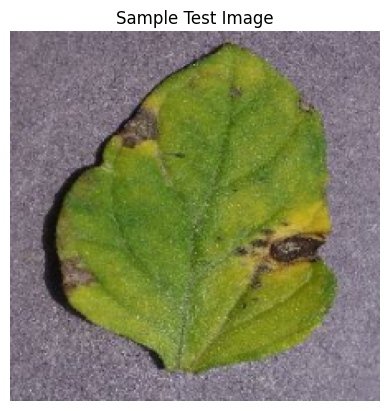

In [ ]:
for images, labels in test_ds.take(1):
    sample_image = images[0]
    sample_label = labels[0]
    break

plt.imshow(sample_image.numpy().astype("uint8"))
plt.title("Sample Test Image")
plt.axis("off")
plt.show()

In [ ]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(tf.expand_dims(img_array, axis=0))
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


In [ ]:
cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 256)            │    22,151,424 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_42 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 66,738,644 (254.59 MB)

 Trainable params: 22,246,214 (84.86 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 44,492,430 (169.73 MB)

In [ ]:
# Resize image and normalize
img_array = tf.image.resize(sample_image, (224, 224)) / 255.0
# Call the model once to define the outputs
_ = cnn_model(tf.expand_dims(img_array, axis=0)) # this line ensures the model is called before accessing its output.
# Get heatmap
heatmap = make_gradcam_heatmap(img_array, cnn_model, "conv2d_6")

# Superimpose on original image
def superimpose_heatmap(img, heatmap, alpha=0.4):
    img = img.numpy()
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = heatmap_color * alpha + img
    superimposed = np.clip(superimposed, 0, 255).astype("uint8")

    return superimposed

# Visualize
overlay_img = superimpose_heatmap(sample_image, heatmap)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(sample_image.numpy().astype("uint8"))
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Grad-CAM Overlay")
plt.imshow(overlay_img)
plt.axis("off")
plt.show()

AttributeError: The layer sequential has never been called and thus has no defined output.

# LIME

In [ ]:
!pip install lime
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
import tensorflow as tf


In [ ]:
# Preprocessing function (resize and scale between 0-1)
def preprocess(img):
    img = tf.image.resize(img, (224, 224))
    img = img / 255.0
    return img

# Prediction function wrapper for LIME
def predict_fn(images):
    images = tf.convert_to_tensor(images, dtype=tf.float32)
    preds = cnn_model(images)
    return preds.numpy()


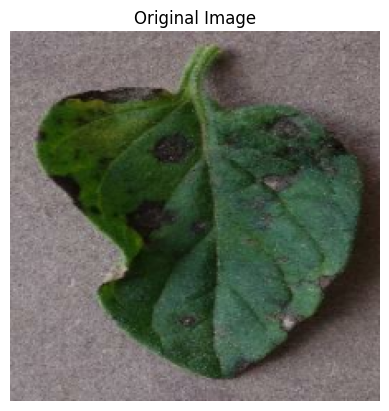

In [ ]:
# Take one image from test dataset
for images, labels in test_ds.take(1):
    sample_image = images[0].numpy().astype('double')  # LIME needs float64
    break

plt.imshow(sample_image.astype('uint8'))
plt.title("Original Image")
plt.axis("off")
plt.show()


In [ ]:
explainer = lime_image.LimeImageExplainer()

explanation = explainer.explain_instance(
    sample_image,                      # Raw image (HWC)
    classifier_fn=predict_fn,         # Your model wrapped
    top_labels=len(class_names),                     # Number of classes to explain
    hide_color=0,                     # What to replace hidden pixels with
    num_samples=1000                  # Number of perturbations
)


  0%|          | 0/1000 [00:00<?, ?it/s]

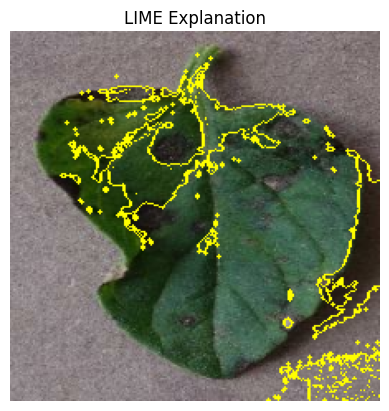

In [ ]:
from skimage.color import label2rgb

temp, mask = explanation.get_image_and_mask(
    label=explanation.top_labels[0],
    positive_only=True,
    num_features=10,
    hide_rest=False
)

plt.imshow(mark_boundaries(temp / 255.0, mask))
plt.title("LIME Explanation")
plt.axis("off")
plt.show()


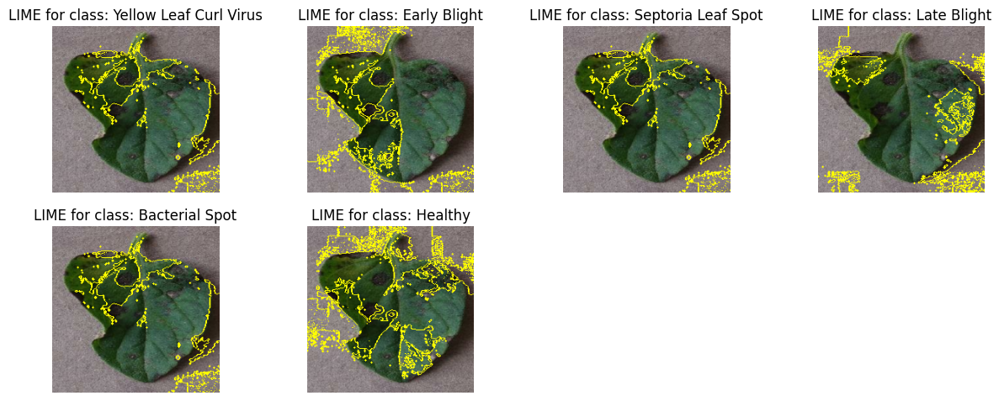

In [ ]:
from skimage.color import label2rgb

# Replace with your actual class names if available
# Example: class_names = ['Bacterial Spot', 'Early Blight', ...]
class_names = list(train_ds.class_names)

# Number of classes to visualize (you can change this)
num_classes_to_show = len(class_names)

plt.figure(figsize=(15, 3 * num_classes_to_show))

for i, label_index in enumerate(explanation.top_labels[:num_classes_to_show]):
    temp, mask = explanation.get_image_and_mask(
        label=label_index,
        positive_only=True,
        num_features=10,
        hide_rest=False
    )

    lime_result = mark_boundaries(temp / 255.0, mask)

    plt.subplot(num_classes_to_show, 4, i + 1)
    plt.imshow(lime_result)
    plt.title(f"LIME for class: {class_names[label_index]}")
    plt.axis("off")


plt.show()